In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import scipy.io
import os

In [2]:
v_th=0.6
SC_base_dir= '/gerda/mcintosh_lab/jgriffiths/hcp_wuminn_l2k8_tracks_conmats/data/results/hcp_wuminn/tractography/dipy/l2k8/'
TS_base_dir='/gerda/mcintosh_lab/jgriffiths/hcp_wuminn_l2k8_rsfmri_ts/data/results/'
out_dir =  '/brunhild/mcintosh_lab/jwang/ModelFitting/DecoWeights/' #'/brunhild/mcintosh_lab/jwang/ModelFitting/Linear_gains/'
import pandas as pd
#groups =[grp for grp in os.listdir(base_dir)]
TS_df=pd.read_pickle('/scratch/mcintosh_lab/jgriffiths/hcp_wuminn_l2k8_rsfmri_ts_LATEST/data/results/100307_rfMRI_REST1_LR_hpc200_clean__l2k8_sc33_ts.pkl')

In [3]:
TS=TS_df.values

In [4]:
def sigmoid(x):
    return 1.0/(1+np.exp(-x))
def smooth_normalize(x):
        x[x< 0.000001] =0.000001
    
        return x
def f_diffusion_tr_noise(X, Wo, Theta):
    
    def smooth_normalize_ct(x, center):
        return center+ (center-0.001)*np.tanh((x-center)/(center - 0.001))
    def smooth_normalize(x):
        x[x< 0.000001] =0.000001
    
        return x

    def sigmoid(a, b, d, x):
        return np.abs(a*x-b)/(0.00001+np.abs(1.00-np.exp(-d*(a*x-b))))
    G = 5000.0/0.4590/0.641  + 4000.*np.tanh(Theta[4:5])
    #G=5000.0/0.4590/0.641 + smooth_normalize(Theta[4:5])
    W_n = np.reshape(Theta[5:], [batch_size,batch_size])
    W_n = 1+ np.tanh((W_n+W_n.T)/2.0)
    W_n = W_n * Wo
    
    Ws = W_n/np.linalg.norm(W_n)
    gEI= 0.1 + smooth_normalize(Theta[0:1])
    W1= .1 + smooth_normalize(Theta[1:2])
    #gEE= 0.15* (1+np.tanh(Theta[2:3])/5.0)
    gEE= 0.001 + smooth_normalize(Theta[2:3])
    gIE= 0.1+smooth_normalize(Theta[3:4])
    #Tr= 1.
    #step_size = 0.05
    num_para = 0
    dt = step_size
    state_size = np.int(Tr/step_size)
    N=1
    #ROI_size=96
    #Jnmda = 0.15
    #W=(Gi*W0)/np.linalg.norm(Gi*W0)
    L_s = -np.diag(np.sum(Ws, axis= 1)) + Ws
    I0 = 0.3772/1.
    gamma = 0.641/1000.
    gammaI = 1.0/1000.
    #Wplus = .8
    Ie = 0
     #smooth_normalize_ct(_Ji[:,0],1.0)
    aE = 310
    bE = 125
    dE_0 = 0.16
    WE = 1.0 #18.4576#1.0
    
    aI = 615
    bI = 177
    dI_0 = 0.087
    WI = 0.7
    
    tauE = 100.
    tauI = 10.
    
    
    #W1= 0.05
    
    #G = .1
    
    E = X[num_para:num_para+N*ROI_size]#smooth_normalize_ct(X[num_para:num_para+N*ROI_size], 0.5)
    I = X[num_para+N*ROI_size:num_para+2*N*ROI_size]#smooth_normalize_ct(X[num_para+N*ROI_size:num_para+2*N*ROI_size], .5)
    q = X[-N*ROI_size:] #smooth_normalize_ct(X[-N*ROI_size:],1.0)
    v = X[-2*N*ROI_size:-N*ROI_size]#smooth_normalize_ct(X[-2*N*ROI_size:-N*ROI_size],1.)
    f = X[-3*N*ROI_size:-2*N*ROI_size]#smooth_normalize_ct(X[-3*N*ROI_size:-2*N*ROI_size], 1.)
    x = X[-4*N*ROI_size:-3*N*ROI_size]#np.tanh(X[-4*N*ROI_size:-3*N*ROI_size])#smooth_normalize(X[-4*N*ROI_size:-3*N*ROI_size], .5)
    #print(E.shape)
    #subID='AD_016_S_4902.mat'
    
    
    rho=0.34;
    tau_0=0.98;
    #tau_s=0.8;
    #tau_f=0.4;
    alpha =0.32;
    #s=0.5;
    #E = np.tanh(E/200.0)
    #I =np.tanh(I/200.0)
    def fout(v, k):
        return (k*v)**(1.0/alpha)/k
    def Ef(f,k):
        return 1.0-(1.0- rho)**(1.0/f/k)
    
    
    k = 1.
    #x=x/(np.max(np.abs(x))+0.002)
    #print E.shape
    sigma = 1.
    
    epsilon = 1.0 #+ 0.2 *np.tanh(Theta[5:6]) # smooth_normalize(X[5:6], 0.5)
    tau_s = 0.65 #+ 0.2 *np.tanh(Theta[6:7])
    tau_f = 0.41 #+ 0.2 *np.tanh(Theta[7:8])
    for i in range(state_size):
        
        IE = 1*WE*I0 + gEE*E + G*np.dot(L_s, E) -gIE*(I) + Ie
        II = WI*I0 + gEI*E - I 
         
        dE =  E - dt*(E+gamma*3.0631*tauE)/tauE \
           -dt*E*gamma*(3.0631+0.4590*np.tanh(IE- 0.3772)) + dt*gamma*(3.0631+0.4590*(IE - 0.3772))\
                +W1*np.sqrt(dt/state_size)*np.random.randn(ROI_size)
            
        
        dI =  I - dt*(I)/tauI \
             + dt*gammaI*sigmoid(aI, bI, dI_0, II)\
            +W1*np.sqrt(dt/state_size)*np.random.randn(ROI_size)
        
        
        dx = x+dt*(epsilon*(E)/sigma \
                   -1.0/tau_s*x \
               -1.0/tau_f *(k*f-1))
        f_tmp= f+dt*1/k*x
        dv= v+dt*(f/tau_0 -fout(v,k)/tau_0)
        dq= q+ dt*(f*Ef(f,k)/rho/tau_0\
                  -q/v*fout(v,k)/tau_0)
        df = f_tmp
        
        x = np.tanh(dx) #smooth_normalize(dx, 0.5)
        v = smooth_normalize_ct(dv, 1.0) #a+ b*np.tanh((dv-a)/b)
        f = smooth_normalize_ct(df, 1.0) #a+ b*np.tanh((df-a)/b)
        q = smooth_normalize_ct(dq, 1.0) #a+ b*np.tanh((dq-a)/b)
        E = np.tanh(dE)#1.0 + np.tanh(dE - 1.0) #smooth_normalize_ct(dE, 1.0)#np.tanh(dE/200.0)
        I = np.tanh(dI)#1.0 + np.tanh(dI - 1.0)#smooth_normalize_ct(dI, 1.0)#np.tanh(dI/200.0)
    """return np.concatenate((g1,g2,g12,g21,sigma,epsilon,tau_s,tau_f,\
                           E, I, x, f, v, q))"""
    return np.concatenate((E, I, x, f, v, q))

def h_diffusion_noise(X, Theta):
    def smooth_normalize_ct(x, center):
        return center+ (center-0.001)*np.tanh((x-center)/(center - 0.001))
    def smooth_normalize(x):
        x[x< 0.000001] =0.000001
    
        return x

   
    
    W2= 0.02 #Theta[3:4]#0.02 + smooth_normalize(Theta[3:4])
    E0=0.34
    rho=0.34
    k1 = 7*E0
    k2 = 2.
    k3 = 2*E0-0.2
    #w= Theta[3:4]
    #W2 = 0.01
    V = 0.02 #1.0 + smooth_normalize(Theta[9:10])
    #V= 30.0
    q = smooth_normalize_ct(X[-ROI_size:],1.0)
    v = smooth_normalize_ct(X[-2*ROI_size:-ROI_size],1.0)
    k= 1.
    #v = a+ a*np.tanh((v-a)/a)/1.1
    y= k1*(1-k*q)+k2*(1-q/v)+k3*(1-k*v)
    #q = a+ a*np.tanh((q-a)/a)/1.1
    return 100.0/E0*V*(y)+W2*np.random.randn(ROI_size)

In [5]:
Tr= 2.
num_epochs =1*1
echo_step = 1
num_data = TS.shape[0]
truncated_backprop_length = 15
total_series_length = num_data -echo_step #50000

step_size = 0.1
state_size = 6 #np.int(6* Tr/step_size)

num_classes = 1
batch_size = 83
num_batches = total_series_length-truncated_backprop_length

In [12]:
tf.reset_default_graph()
    
    
L_new = tf.placeholder(tf.float32, [batch_size, batch_size])
batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length \
                                    +2*truncated_backprop_length*np.int(Tr/step_size)])
batchY_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])



def fout(v):
    return tf.pow(v, tf.constant(1./.2, dtype=tf.float32))
def Ef(f):
    rho = 0.34
    return tf.constant(1., dtype=tf.float32)-tf.pow(tf.constant(1.-rho, dtype=tf.float32), tf.reciprocal(f))
def h_tf(a, b, d, x):
    return tf.abs(a*x-b)/(0.00001+tf.abs(1.0 -tf.exp(-d*(a*x-b))))

def smooth_normalize_ct(x, center):
    
    
    return center+ (center-0.001)*tf.tanh((x-center)/(center - 0.001))





sigma = tf.constant(1.0, dtype=tf.float32) 
epsilon = tf.constant(1.0, dtype=tf.float32)# + 0.3 *np.tanh(X[5:6]) # smooth_normalize(X[5:6], 0.5)
tau_s = tf.constant(0.65, dtype=tf.float32)# + 0.2 *np.tanh(X[6:7])
tau_f = tf.constant(0.41, dtype=tf.float32)# + 0.3 *np.tanh(X[7:8])

I0=tf.constant(0.3772, dtype=tf.float32)
gamma = tf.constant(0.641/1000.0, dtype=tf.float32)
gammaI = tf.constant(1/1000.0, dtype=tf.float32)

Ie = tf.constant(0.0, dtype=tf.float32)

aE=tf.constant(310, dtype=tf.float32)
bE = tf.constant(125, dtype=tf.float32)
dE =tf.constant(0.16, dtype=tf.float32)
WE= tf.constant(1, dtype=tf.float32)
tauE= tf.constant(100, dtype=tf.float32)

aI=tf.constant(615, dtype=tf.float32)
bI = tf.constant(177, dtype=tf.float32)
dI =tf.constant(0.087, dtype=tf.float32)
WI= tf.constant(0.7, dtype=tf.float32)
tauI= tf.constant(10, dtype=tf.float32)

rho=tf.constant(0.34, dtype=tf.float32)
E0=tf.constant(0.34, dtype=tf.float32)
k1 = tf.constant(7*0.34, dtype=tf.float32)
k2 =tf.constant( 2, dtype=tf.float32)
k3 = tf.constant(2*0.34-0.2, dtype=tf.float32)
   
V = tf.constant(0.02, dtype=tf.float32)
rho= tf.constant(0.34, dtype=tf.float32)
tau_0= tf.constant(0.98, dtype=tf.float32) 
    #tau_s=0.8;
    #tau_f=0.4;
alpha =tf.constant(0.32, dtype=tf.float32)

dt=tf.constant(step_size, dtype=tf.float32)
   
E_fr= tf.constant(np.zeros((batch_size,1)), dtype=tf.float32)

#gi0 = 1.* np.zeros((batch_size,1))
Ws0 = np.zeros((batch_size,batch_size))+0.05
g0 = 0.
   
W1 = tf.Variable(0.5, dtype=tf.float32)
gEE =tf.Variable(0.15, dtype=tf.float32)
G = tf.Variable(g0, dtype=tf.float32)
#Gi = tf.Variable(gi0, dtype=tf.float32)
Ws = tf.Variable(Ws0, dtype=tf.float32)
gEI = tf.Variable(0.15, dtype=tf.float32)

gIE = tf.Variable(1.0, dtype=tf.float32)   
    

# Unpack columns

inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

W_n= 1+tf.tanh((Ws+tf.transpose(Ws))/2.0)
W_n = W_n * L_new

W_s =W_n/tf.norm(W_n)
L= -tf.diag(tf.reduce_sum(W_s, axis=1)) + W_s

# Forward pass
current_state = init_state
#current_state = _current_state
states_series = []
inhi_series = []
logits_series = []



for j, label_tmp in enumerate(labels_series):
    #current_input = tf.reshape(current_input, [batch_size, 1])
    #input_and_state_concatenated = tf.concat([current_input, current_state],1)  # Increasing number of columns
    
    
  
    E=current_state[:,0:1]
    I=current_state[:,1:2]
    x=current_state[:,2:3]
    f=current_state[:,3:4]
    v=current_state[:,4:5]
    q=current_state[:,5:6]
    
    G_p = 5000./0.641/0.459 +4000.*tf.tanh(G)
    #G_p = 5000./0.641/0.459 +tf.nn.relu(G)
    gIE_p = 0.1+ tf.nn.relu(gIE) #smooth_normalize_ct(Ji, tf.constant(1.0, dtype=tf.float32), tf.constant(0.0, dtype=tf.float32), tf.constant(1.0, dtype=tf.float32))
    
    gEI_p =0.1+tf.nn.relu(gEI)
    gEE_p =0.001+ tf.nn.relu(gEE)
    
    
    W1_p = .1 + tf.nn.relu(W1)
    #W2_p = 0.01 + tf.nn.relu(W2)
    #W = (Gi_p*L_new)/tf.norm(Gi_p*L_new)
    #L = -tf.diag(tf.reduce_sum(W, axis=1)) + W
    for i in range(np.int(echo_step*Tr/step_size)):
        noise = tf.reshape(inputs_series[truncated_backprop_length+j*np.int(echo_step*Tr/step_size)+i],[batch_size, 1] )
        noise1 = tf.reshape(inputs_series[truncated_backprop_length+truncated_backprop_length*np.int(echo_step*Tr/step_size)\
                                +j*np.int(echo_step*Tr/step_size)+i],[batch_size, 1] )
        
        IE = WE*I0 + gEE_p*E + G_p*tf.matmul(L, E) -gIE_p*(I) + Ie +(i==0)*tf.reshape(inputs_series[j],[batch_size,1])
                   
        II = WI*I0 + gEI_p*E - I
        
        #IE = 125/310.0 -0.026 +0.006*tf.tanh(IE/100. - 125/310.0 + 0.026) 
        #(3.0631+0.4869*tf.tanh(h_tf(aE, bE, dE, IE)-3.0631)) 
        E_new =E - dt*(E+gamma*tauE*3.0631)/tauE \
                    + dt*gamma*(3.0631+0.4590*(IE-0.3772))\
                     - dt*E*gamma*(3.0631+0.4590*tf.tanh(IE-0.3772))\
               +W1_p*tf.sqrt(dt/tf.constant(Tr/step_size, dtype=tf.float32))*noise
        I_new =I - dt*(I)/tauI \
                   + dt*gammaI*h_tf(aI, bI, dI, II) \
                   +W1_p*tf.sqrt(dt/tf.constant(Tr/step_size, dtype=tf.float32))*noise1
    
    
        dx = x+dt*(epsilon*E/sigma\
                   -tf.constant(1., dtype=tf.float32)/tau_s*x  \
                   -tf.constant(1., dtype=tf.float32)/tau_f*(f-tf.constant(1., dtype=tf.float32)))
        f_tmp= f+dt*x 
        dv= v+dt*(f/tau_0 -fout(v)/tau_0) 
        dq=q+ dt*(tf.multiply(f,Ef(f))/rho/tau_0-tf.multiply(tf.divide(q,v) ,fout(v)) /tau_0)
        v=smooth_normalize_ct(dv, 1.0)
        q=smooth_normalize_ct(dq, 1.0)
        f=smooth_normalize_ct(f_tmp, 1.0)
        x= tf.tanh(dx)
        E= tf.tanh(E_new) #smooth_normalize_ct(E_new, tf.constant(1., dtype=tf.float32), tf.constant(0., dtype=tf.float32), tf.constant(1.0, dtype=tf.float32))
        I= tf.tanh(I_new) #smooth_normalize_ct(I_new, tf.constant(1., dtype=tf.float32), tf.constant(0., dtype=tf.float32), tf.constant(1.0, dtype=tf.float32))
        
        #E_fr = sigmoid_tf(aE, bE, dE, IE)
    next_state = tf.concat([E, I, x, f, v, q],1)  # Broadcasted addition
    #IE = WE*I0 + Wplus_p*Jnmda_p*E + G_p*Jnmda_p*tf.matmul(W, E) -tf.multiply(Ji_p,I) + Ie
    #E_fr = h_tf(aE, bE, dE, IE)
    states_series.append(next_state)
    #inhi_series.append(E_fr)
    current_state = next_state 
#current_state = states_series[0]
print(states_series[0].shape)
print(inputs_series[0].shape)
print(len(inputs_series))
print(len(states_series))
#logits_series = [tf.reshape(tf.matmul(W2, tf.reshape(tf.tanh(state), [batch_size*state_size, 1])) + b2, [batch_size,]) for state in states_series]#Broadcasted addition

logits_series = [100/E0*V*(k1*(tf.constant(1., dtype=tf.float32)-state[:, 5])\
                 +k2*(tf.constant(1., dtype=tf.float32)-tf.divide(state[:, 5],state[:, 4]))\
                 +k3*(tf.constant(1., dtype=tf.float32)-state[:, 4]))\
                 for state in states_series]
print(logits_series[0].shape)
print(labels_series[0].shape)

predictions_series = logits_series

labels_series_tf = tf.stack(labels_series,axis=1)
logits_series_tf = tf.stack(logits_series,axis=1)
#labels_series_tf = labels_series[0]
#logits_series_tf = states_series[0]
labels_series_tf_n = labels_series_tf - tf.matmul(tf.reshape(tf.reduce_mean(labels_series_tf, 1), [batch_size,1]),\
                            tf.constant(np.ones((1,truncated_backprop_length)), dtype=tf.float32))
logits_series_tf_n = logits_series_tf - tf.matmul(tf.reshape(tf.reduce_mean(logits_series_tf, 1), [batch_size,1]),\
                            tf.constant(np.ones((1,truncated_backprop_length)), dtype=tf.float32))


cov_sim =tf.matmul(logits_series_tf_n, tf.transpose(logits_series_tf_n))
cov_def= tf.matmul(labels_series_tf_n, tf.transpose(labels_series_tf_n))


FC_sim_T = tf.matmul(tf.matmul(tf.diag(tf.reciprocal(tf.sqrt(tf.diag_part(cov_sim)))), cov_sim), \
                     tf.diag(tf.reciprocal(tf.sqrt(tf.diag_part(cov_sim)))))
FC_T = tf.matmul(tf.matmul(tf.diag(tf.reciprocal(tf.sqrt(tf.diag_part(cov_def)))), cov_def), \
                 tf.diag(tf.reciprocal(tf.sqrt(tf.diag_part(cov_def))))) 
#FC_T= tf.constant(FC, dtype=tf.float32)

ones_tri=np.tril(np.ones((83,83)),-1)#tf.matrix_band_part(tf.ones_like(FC_T)-tf.diag(tf.ones((batch_size,))), 0, -1)
#zeros = tf.zeros_like(FC_T) # create a tensor all ones
mask = ones_tri> 0.0#tf.greater(ones_tri, zeros) # boolean tensor, mask[i] = True iff x[i] > 1
FC_tri_v = tf.boolean_mask(FC_T, mask)

FC_v = FC_tri_v - tf.reduce_mean(FC_tri_v)*tf.ones_like(FC_tri_v)


FC_sim_tri_v = tf.boolean_mask(FC_sim_T, mask)
FC_sim_v = FC_sim_tri_v - tf.reduce_mean(FC_sim_tri_v)*tf.ones_like(FC_sim_tri_v)

corr_FC =tf.reduce_sum(tf.multiply(FC_v,FC_sim_v))\
                  /tf.sqrt(tf.reduce_sum(tf.multiply(FC_v,FC_v)))\
                /tf.sqrt(tf.reduce_sum(tf.multiply(FC_sim_v,FC_sim_v)))
        
losses_corr = tf.square(1- corr_FC)
losses = tf.sqrt(tf.reduce_mean(tf.multiply(FC_sim_v-FC_v, FC_sim_v-FC_v)))
#losses = tf.sqrt(tf.reduce_mean(tf.multiply(cov_sim-cov_def, cov_sim-cov_def)))

    
total_loss = losses_corr +0.5*tf.square(tf.reduce_mean(FC_tri_v)-tf.reduce_mean(FC_sim_tri_v))#+ 0.05*W1**2
      

"""losses =[tf.losses.mean_squared_error(labels, logits) for labels, logits in \
         zip(labels_series,logits_series)]

total_loss = tf.reduce_mean(losses) #+ 0.01*(g1**2 + 2*g12**2 + g21**2)"""


opt_func = tf.train.AdamOptimizer(.01)




train_step=opt_func.minimize(total_loss)
#train_step = tf.train.GradientDescentOptimizer(.05).minimize(total_loss)
#train_step = tf.train.MomentumOptimizer(learning_rate=0.08, momentum=0.9).minimize(total_loss)
#train_step = tf.train.AdamOptimizer(0.02).minimize(total_loss)
def plot(batch_idx,  W_s, y_array,x_array, params_list, loss_list, batchX, batchY):
       
    plt.subplot(2, 2, 1)
    plt.cla()
    plt.plot(loss_list)
    
    plt.subplot(2, 2, 2)
    plt.cla()
    plt.plot(params_list)
    
    
    plt.subplot(2, 2, 3)
    plt.cla()
    plt.imshow(W_s)
    
    
    plt.subplot(2, 2, 4)
    plt.cla()
    plt.plot(y_array.T)

    
        
    plt.draw()
    plt.pause(0.0001)

(83, 6)
(83,)
615
15
(83,)
(83,)


In [13]:
def model_run(subID,L_s, TS):
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        plt.ion()
        plt.figure()
        plt.show()
        loss_list = []
        params_list = []
        
        
       
        Ws_old = list(np.zeros((83,83)).ravel())
        gEI_old = .15
        W1_old = 0.5
        gEE_old = .15
        gIE_old = 1.
        G_old = 100.
   
        loss_array_old = np.zeros((truncated_backprop_length,))
    
    
        for epoch_idx in range(num_epochs):
        
            TS_dmean =(TS.T -TS.T.mean(axis= 0)).T
            x_in= TS.T[:,:num_data]/np.max(TS)
            y_in= TS.T[:,echo_step:num_data]/np.max(TS)
            if len(loss_list) == 0 or loss_list[len(loss_list)-1]> 0.002:
            
                y_array =np.zeros((batch_size,num_batches))
                x_array =np.zeros((batch_size,num_batches))
                
                initi_con = .1*(np.random.uniform(-1,1,[batch_size, state_size])+np.array([[0, 0, 0,1.1,1.1,1.1]]))
                #initi_con[:,0:2]= 0
                _current_state = initi_con
            
            
                params_old = np.array([gEI_old,  W1_old,  gEE_old, gIE_old, G_old] + Ws_old)
                #print("New data, epoch", epoch_idx)
                loss_array = np.zeros((num_batches,))
                for batch_idx in range(num_batches):
                
                    
                    #for batch_idx in range(209-truncated_backprop_length):
                    start_idx = batch_idx 
                    #start_idx = batch_idx 
                    end_idx = start_idx + truncated_backprop_length

                    batchX = np.hstack((x_in[:,start_idx:end_idx], np.random.randn(batch_size, \
                                                    2*truncated_backprop_length*np.int(Tr/step_size))))
                    batchY = y_in[:,start_idx:end_idx]
                    #print(batchX.shape, batchY.shape, _current_state.shape)
                    _W_s, _Ws, _G, _gEI, _gIE, _W1, _gEE, _total_loss, _train_step, _current_state,\
                               _logits_series, _inhi_series = sess.run(
                    [W_s, Ws, G, gEI, gIE, W1, gEE, total_loss, train_step, current_state, logits_series, inhi_series],
                    feed_dict={
                        batchX_placeholder:batchX,
                        batchY_placeholder:batchY,
                        init_state:_current_state,
                        L_new:L_s
                        })

                    loss_list.append(_total_loss)
                    params_new = np.array([_gEI, _W1, _gEE, _gIE, _G] +list(_Ws.ravel()))#1/(1+np.exp(-_W1))
                    params_list.append(params_new)
                    
                    
                    loss_array[batch_idx] = _total_loss
                
                    y_array[:, batch_idx] = _logits_series[-1]
                   
                
                
                    #print("Step",batch_idx, "Loss", _total_loss)
                
                
        
       
            
    plot(batch_idx, _W_s, y_array, x_array, params_list, loss_list,  batchX, batchY)        
    plt.ioff()
    plt.show()
    #print(Ji_list)
    np.savetxt(out_dir+'HCP_'+subID+'paramsList_test_p.txt', np.array(params_list))
    #np.savetxt(Out_path+'PPMI_'+subID+'Ji.txt', np.array(Ji_list))
    np.savetxt(out_dir+'HCP_'+subID+'sim_fitting_bold_test_p.txt', y_array.T)
    #y_dmean =(y_array.T -y_array.T.mean(axis= 0)).T
    FC_sim = np.corrcoef(y_array[:,10:])
    
    FC = np.corrcoef(TS.T)
    corr_simfit= np.corrcoef(FC[np.tril_indices(batch_size,-1)], FC_sim[np.tril_indices(batch_size,-1)])[0,1]
    print(corr_simfit)
    HCP_par_corr[subID].append(corr_simfit)
    fig, ax = plt.subplots(1,3, figsize=(20,4))
    ax[0].plot(TS)
    img1 =ax[1].imshow(FC_sim -np.diag(np.diag(FC_sim)), cmap='bwr')
    plt.colorbar(img1, ax=ax[1], fraction=0.046, pad=0.04)
    img2 =ax[2].imshow(FC, cmap='bwr')
    plt.colorbar(img2, ax=ax[2], fraction=0.046, pad=0.04)
    plt.show()


0 156233
1 209329
2 154532


<Figure size 432x288 with 0 Axes>

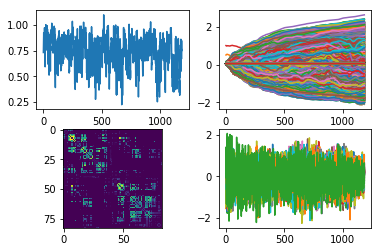

0.692555489404921


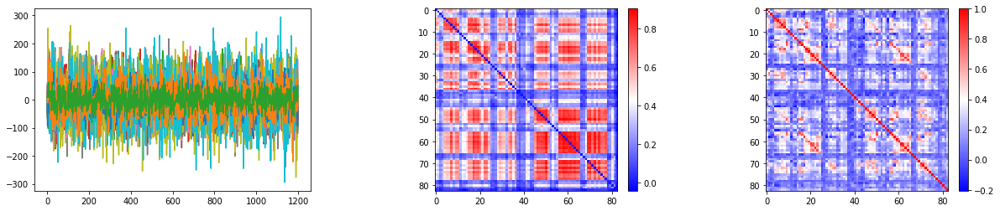

0.7033106365434848


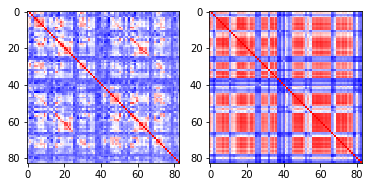

<Figure size 432x288 with 0 Axes>

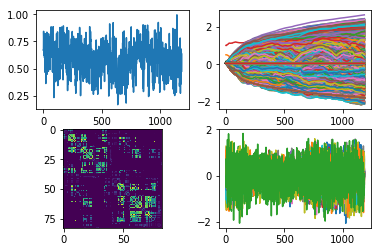

0.9573016325178723


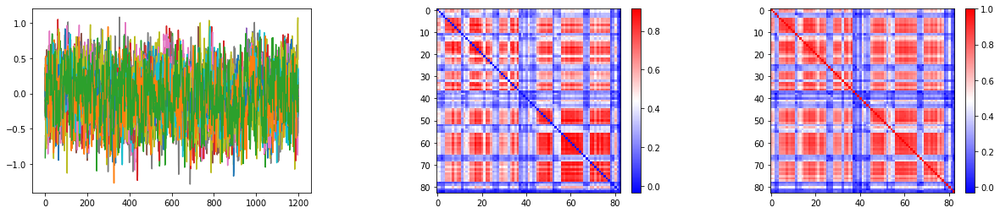

[0.692555489404921, 1.0066118001937867, 0.1665492385625839, 0.9116560051441193, 0.9177800238132476, 20953.59035897247, 0.9573016325178723, 1.508444118499756, 0.22564687803387642, 0.7668598840236663, 1.3572026610374452, 20954.480476676006]
3 172332


<Figure size 432x288 with 0 Axes>

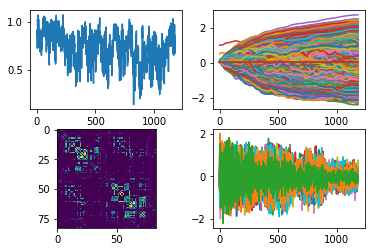

0.6970455246005641


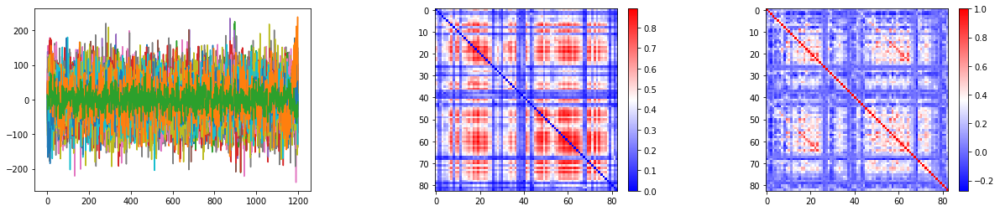

0.7662878195484824


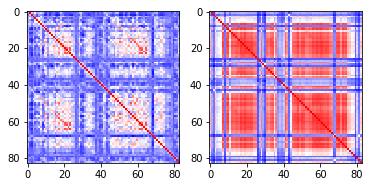

<Figure size 432x288 with 0 Axes>

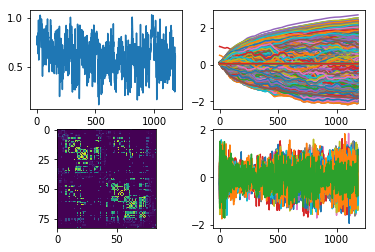

0.9415866277867201


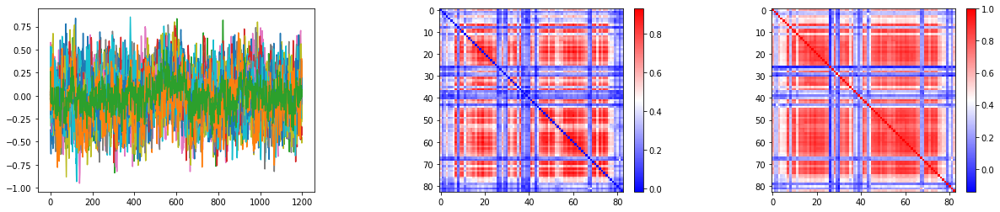

[0.6970455246005641, 0.4232339024543762, 0.100001, 0.38164351975917815, 1.534863293170929, 20962.06629550305, 0.9415866277867201, 0.100001, 0.29697675853967664, 1.0893954644203185, 0.7624935090541839, 20958.641549066364]
4 181131


<Figure size 432x288 with 0 Axes>

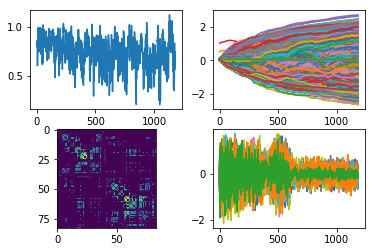

0.5571246287499723


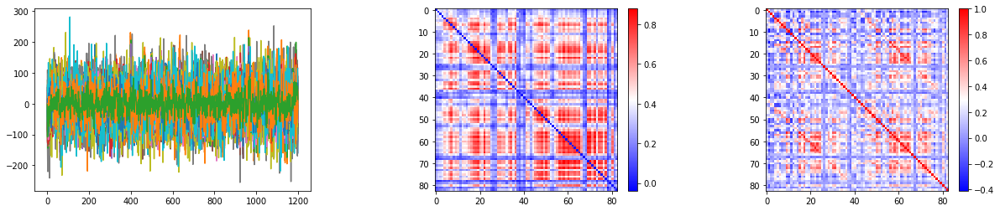

0.6063562232662335


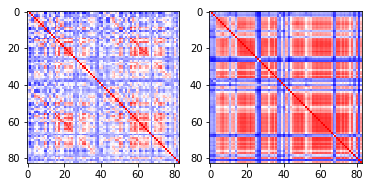

<Figure size 432x288 with 0 Axes>

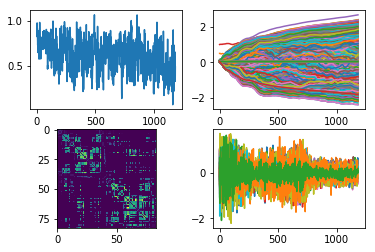

0.896723838583377


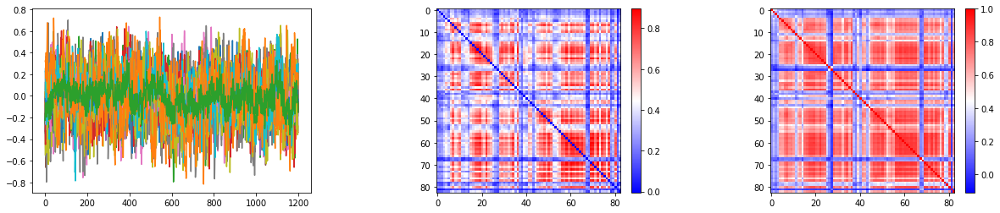

[0.5571246287499723, 0.100001, 0.100001, 0.36534631049633026, 1.345223069190979, 20957.34649187106, 0.896723838583377, 0.6004003793001175, 0.100001, 0.6407561192512512, 1.8985281467437745, 20956.021867247302]
5 317332


<Figure size 432x288 with 0 Axes>

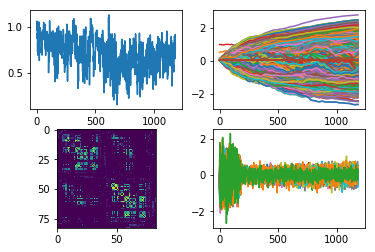

0.6043906773481845


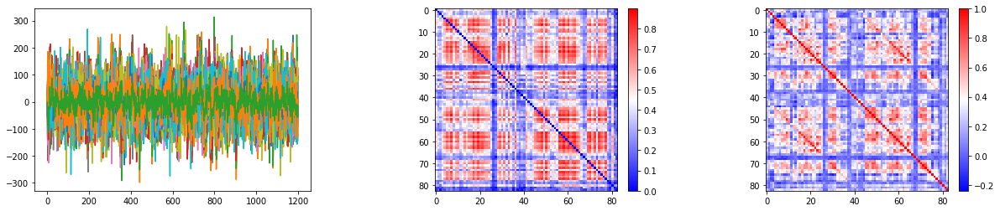

0.7808411839618501


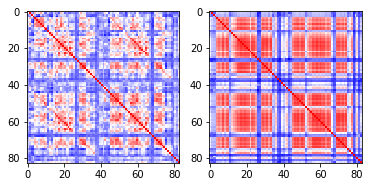

<Figure size 432x288 with 0 Axes>

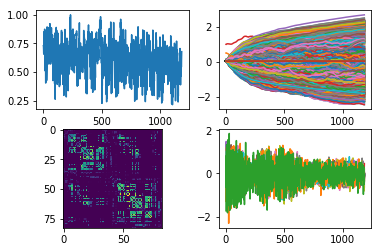

0.9231018459204029


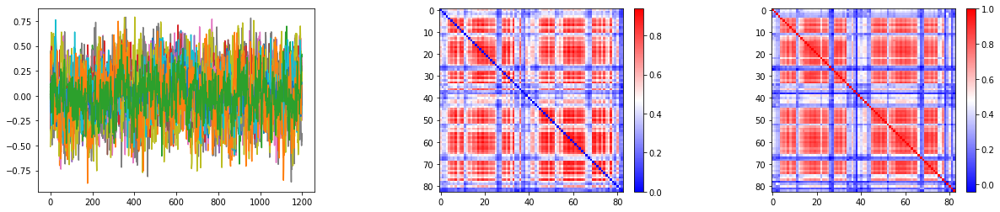

[0.6043906773481845, 0.100001, 0.100001, 0.4301638284921646, 0.31293217539787294, 20963.889495901618, 0.9231018459204029, 0.100001, 0.100001, 0.4871340641975403, 1.6947322607040407, 20957.198337047343]
6 196750


<Figure size 432x288 with 0 Axes>

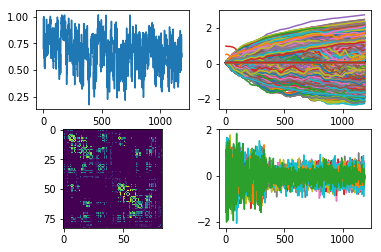

0.7335609334369431


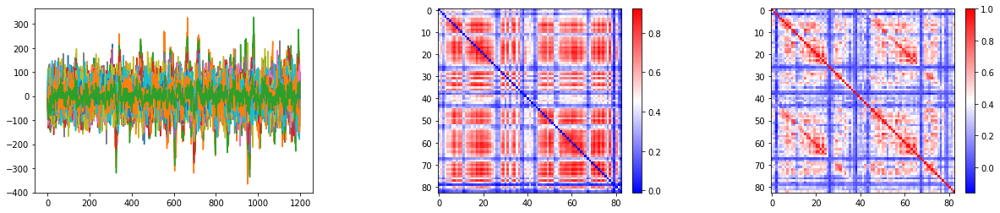

0.8158659080422406


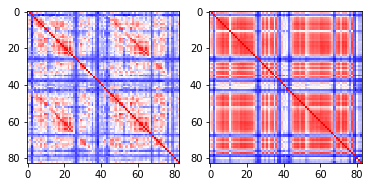

<Figure size 432x288 with 0 Axes>

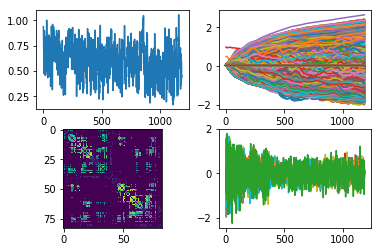

0.8891349550249777


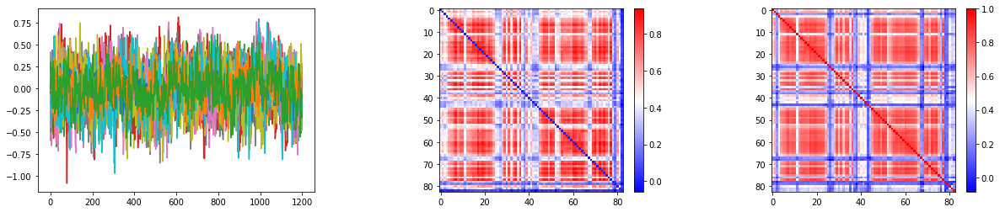

[0.7335609334369431, 0.100001, 0.100001, 0.001001, 1.016360980272293, 20961.43381918216, 0.8891349550249777, 1.083026683330536, 0.100001, 0.001001, 1.1873830318450929, 20954.14338723886]
7 196144


<Figure size 432x288 with 0 Axes>

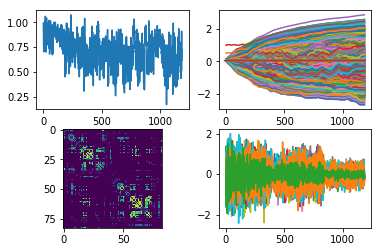

0.6616058614690021


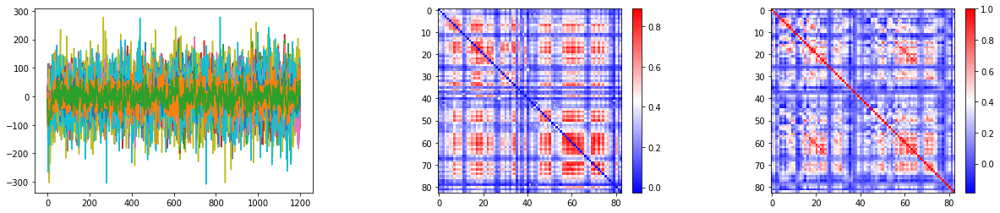

0.7282513450317945


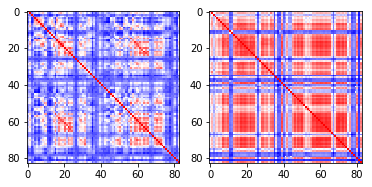

<Figure size 432x288 with 0 Axes>

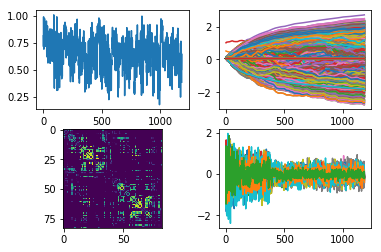

0.8653211002070638


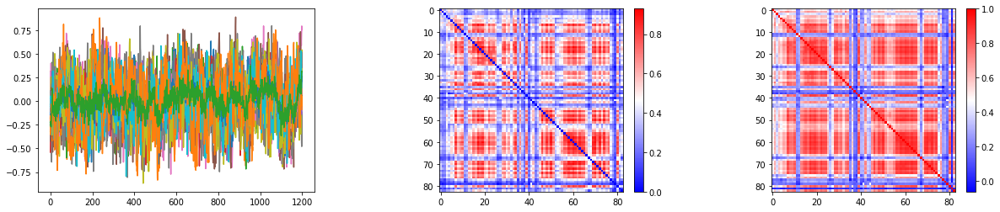

[0.6616058614690021, 0.42046452760696407, 0.100001, 0.4937306532859802, 1.1573054671287537, 20967.573677188662, 0.8653211002070638, 0.8528037190437316, 0.100001, 0.09712770527601242, 1.3590967535972596, 20958.726824290497]
8 231928


<Figure size 432x288 with 0 Axes>

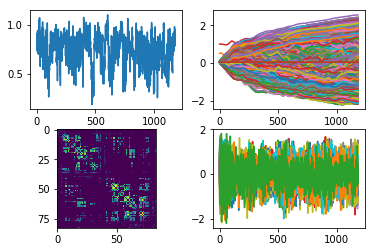

0.7120061507122832


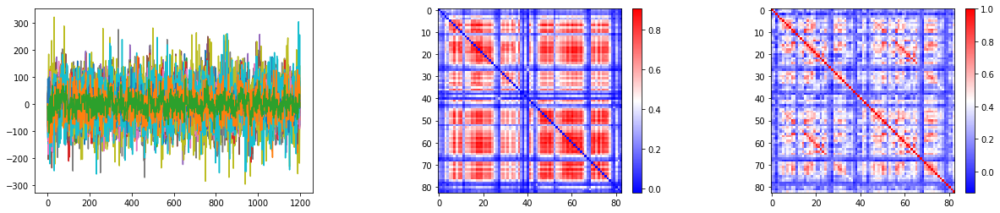

0.7500207072684072


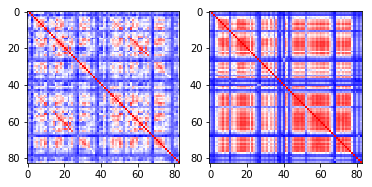

<Figure size 432x288 with 0 Axes>

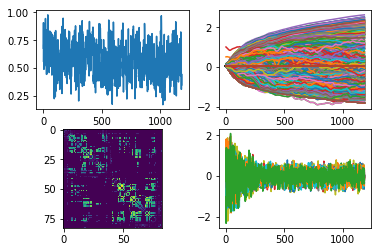

0.8935289343178974


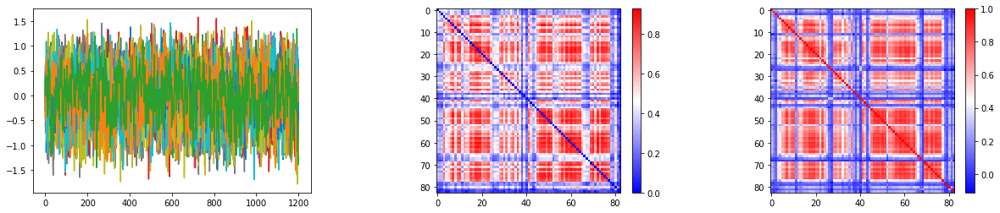

[0.7120061507122832, 0.100001, 0.268490207195282, 1.1480109224319457, 0.7894950747489929, 20946.835230105436, 0.8935289343178974, 0.7759075105190277, 0.100001, 0.5509449968338013, 1.3605479121208193, 20952.609812747603]
9 579867


<Figure size 432x288 with 0 Axes>

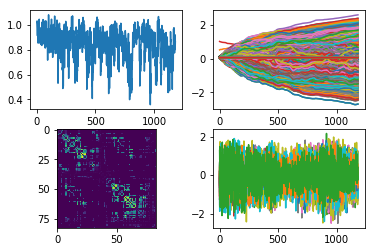

0.5012368151672293


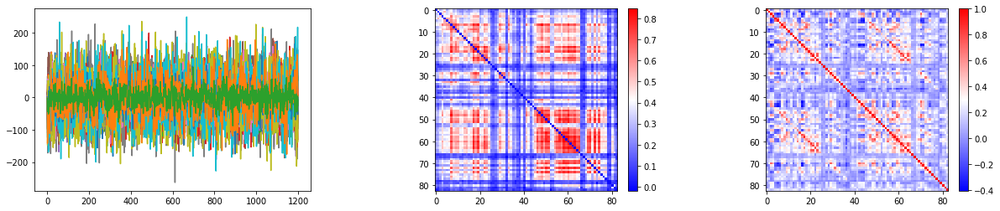

0.5348983122598878


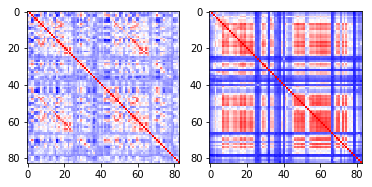

<Figure size 432x288 with 0 Axes>

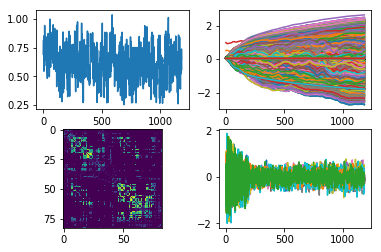

0.881886203095149


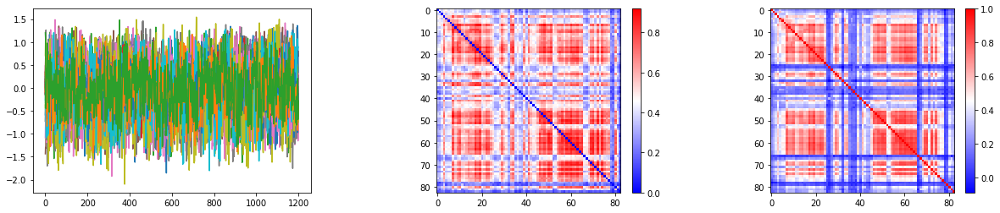

[0.5012368151672293, 0.545151162147522, 0.3172744646668434, 1.3844951519966124, 1.0748856127262116, 20948.54673198411, 0.881886203095149, 0.100001, 0.100001, 1.14748197889328, 1.0395138084888458, 20954.37900454363]
10 146432
11 148941


<Figure size 432x288 with 0 Axes>

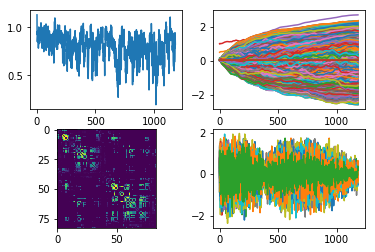

0.643025760113578


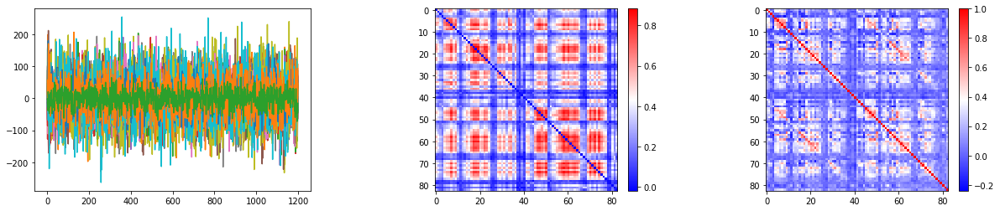

0.6743746507543061


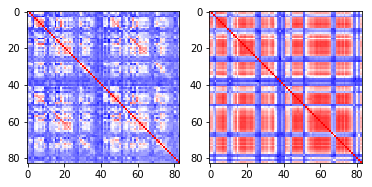

<Figure size 432x288 with 0 Axes>

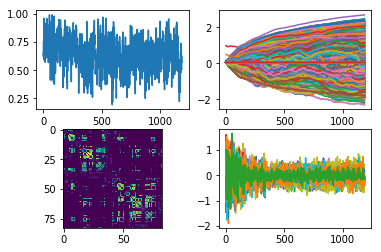

0.8603731629108441


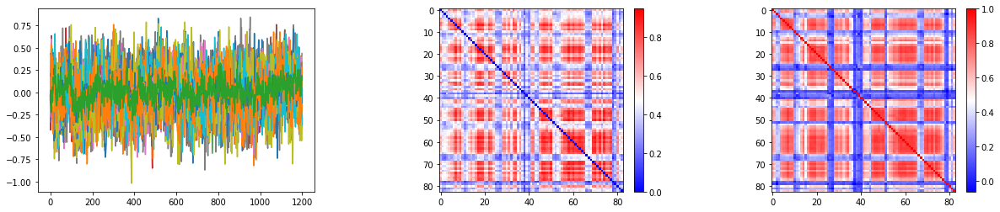

[0.643025760113578, 0.8113205790519714, 0.100001, 0.5256759235858918, 2.3347997188568117, 20959.120454099764, 0.8603731629108441, 0.100001, 0.100001, 1.2143237481117248, 0.5144239753484726, 20957.408899703245]
12 100307


<Figure size 432x288 with 0 Axes>

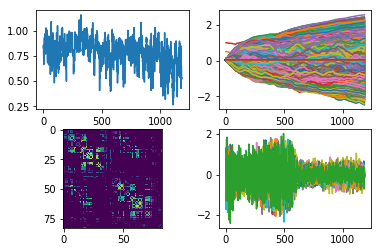

0.5700354740577566


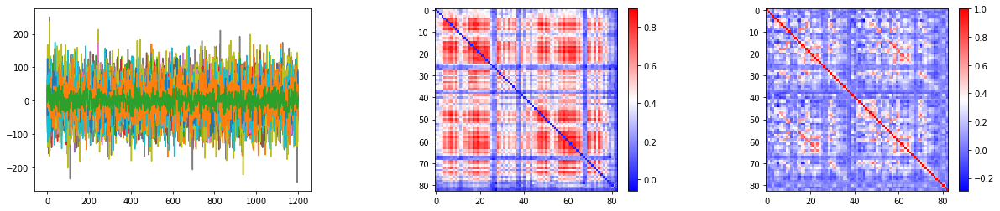

0.6000642304416982


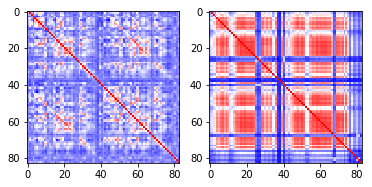

<Figure size 432x288 with 0 Axes>

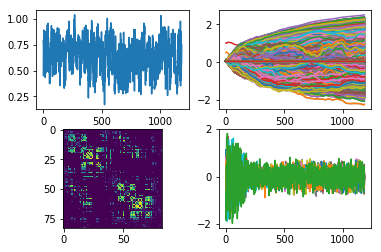

0.8418790203890498


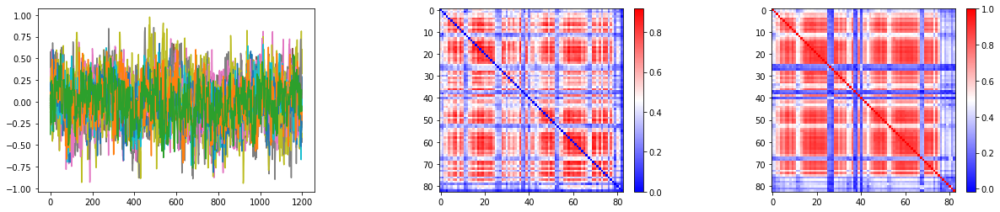

[0.5700354740577566, 0.100001, 0.100001, 0.5474921832084656, 1.4282108426094056, 20947.234528603032, 0.8418790203890498, 0.100001, 0.100001, 1.0701136360168455, 1.4797695875167847, 20940.892174565503]
13 709551
14 155938
15 198451


<Figure size 432x288 with 0 Axes>

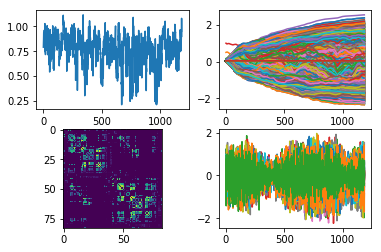

0.7562999865888437


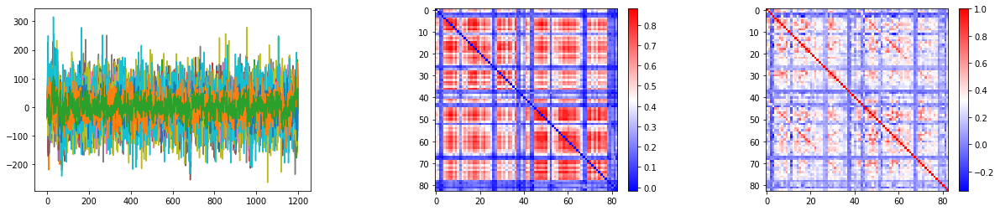

0.7763401042158855


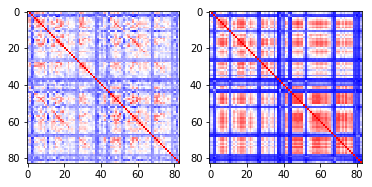

<Figure size 432x288 with 0 Axes>

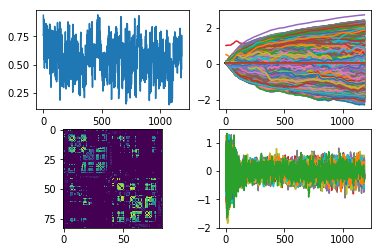

0.9210169217849006


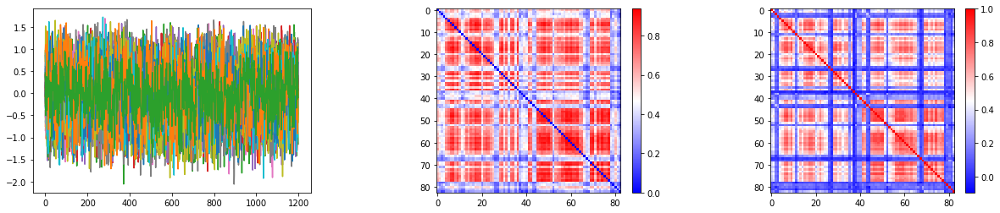

[0.7562999865888437, 0.100001, 0.3910183131694793, 0.12270939221978187, 0.4995911568403244, 20945.794613806018, 0.9210169217849006, 0.100001, 0.100001, 0.6072408685684204, 1.1598411321640016, 20958.239087700313]
16 311320


<Figure size 432x288 with 0 Axes>

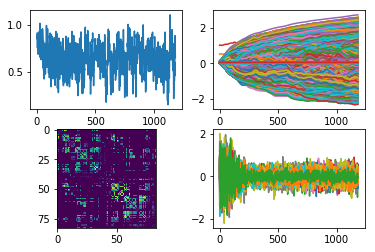

0.6924121147384088


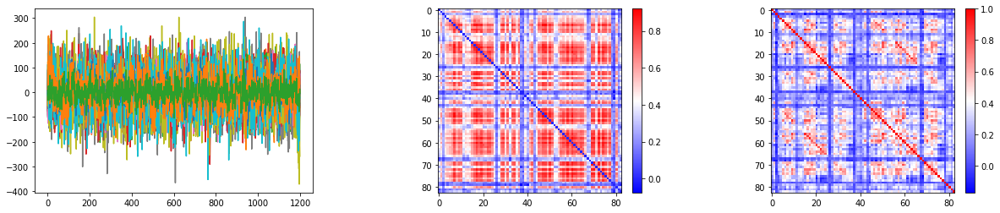

0.7642265069721849


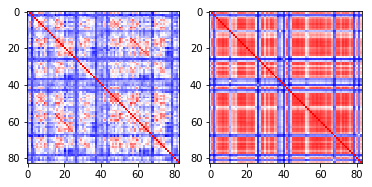

<Figure size 432x288 with 0 Axes>

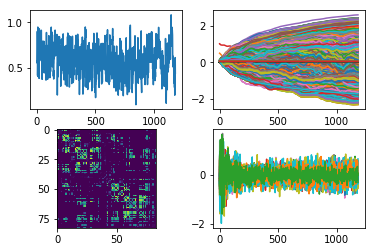

0.922375567284554


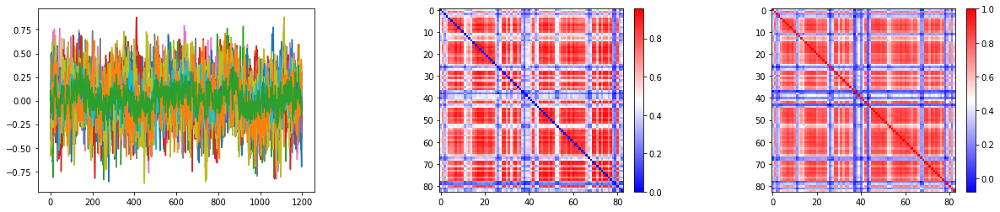

[0.6924121147384088, 0.5102294921875, 0.100001, 0.7421320269107818, 0.8895436704158782, 20959.008549156155, 0.922375567284554, 0.100001, 0.100001, 0.001001, 0.815124785900116, 20949.3115723388]
17 385450
18 173637


<Figure size 432x288 with 0 Axes>

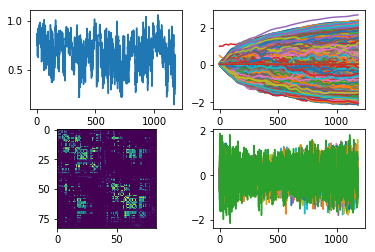

0.8456058816973807


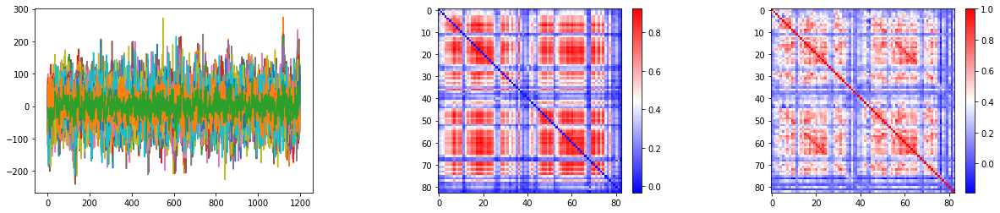

0.8608689201418421


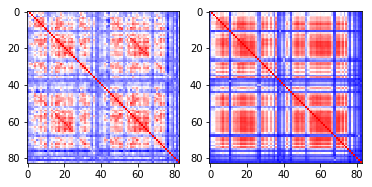

<Figure size 432x288 with 0 Axes>

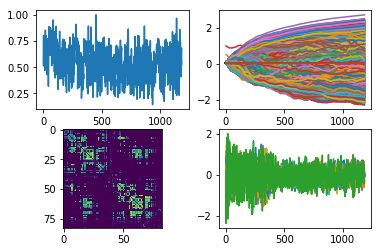

0.9450219373094724


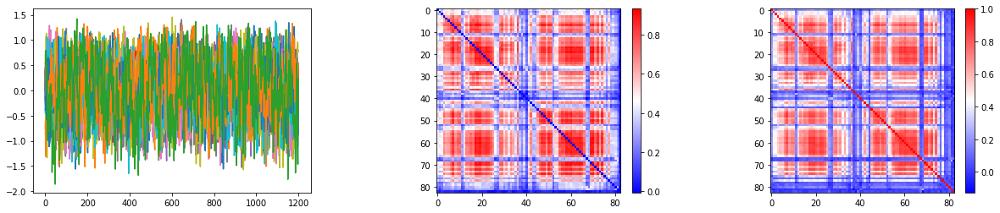

[0.8456058816973807, 0.100001, 0.26883383840322495, 0.23749687170982361, 1.7658325791358949, 20957.374436783324, 0.9450219373094724, 0.100001, 0.100001, 1.1549655923843383, 1.1761829972267153, 20959.052887331072]
19 181636


<Figure size 432x288 with 0 Axes>

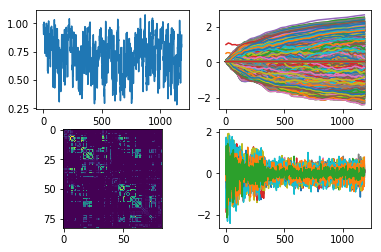

0.6915707652552368


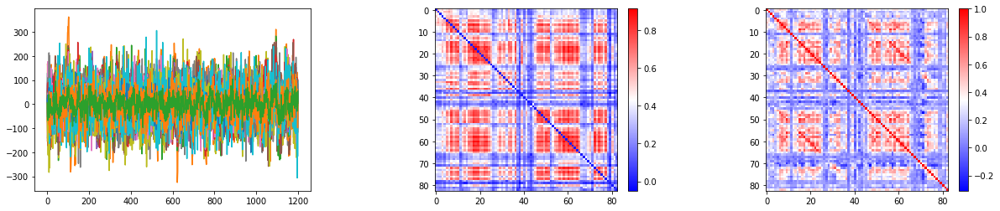

0.7987957521403006


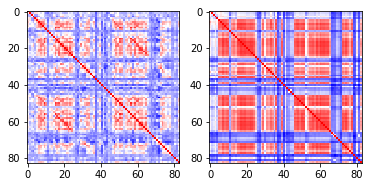

<Figure size 432x288 with 0 Axes>

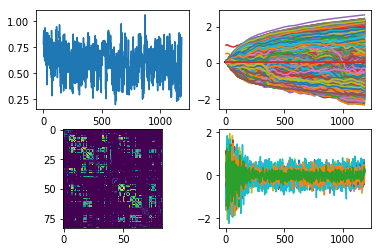

0.8814592720693419


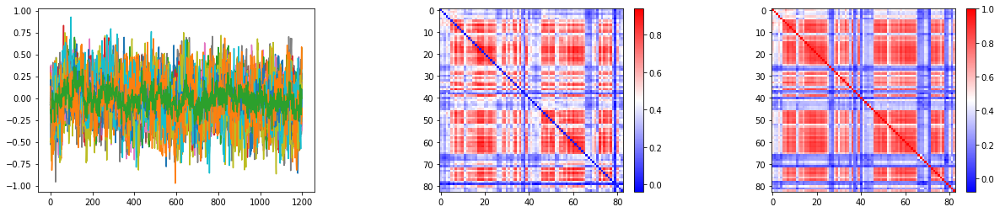

[0.6915707652552368, 0.9888886630535125, 0.100001, 0.9362111876010895, 2.309286117553711, 20957.09094641883, 0.8814592720693419, 0.100001, 0.100001, 0.6073422799110413, 0.9826941847801208, 20955.247784675765]
20 290136


<Figure size 432x288 with 0 Axes>

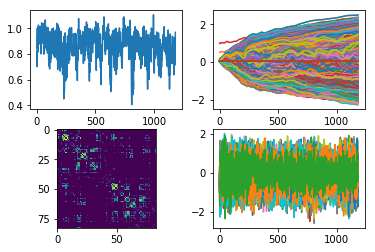

0.5076715024265297


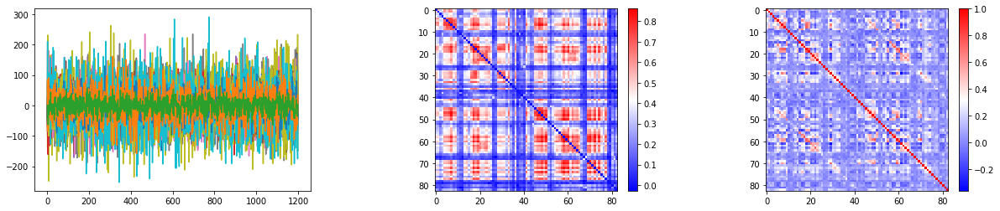

0.5436386763158552


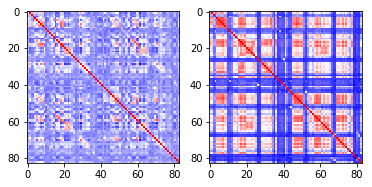

<Figure size 432x288 with 0 Axes>

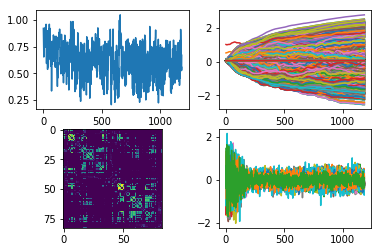

0.8706213490181989


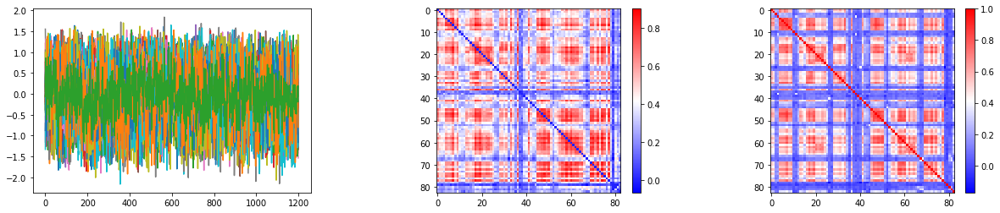

[0.5076715024265297, 0.799837839603424, 0.42478172779083256, 0.35866772329807284, 1.46675705909729, 20926.573170302257, 0.8706213490181989, 0.33593196719884877, 0.100001, 0.001001, 1.356071197986603, 20962.42709602823]
21 198653


<Figure size 432x288 with 0 Axes>

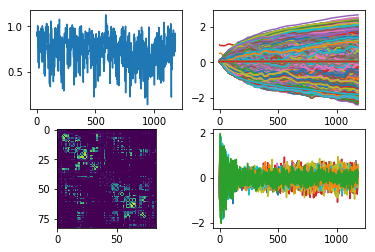

0.6703866498120314


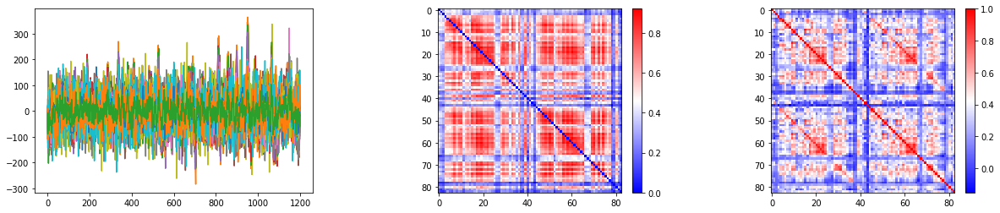

0.7414462359588626


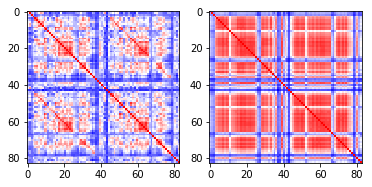

<Figure size 432x288 with 0 Axes>

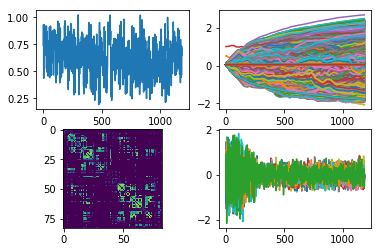

0.8902749532819864


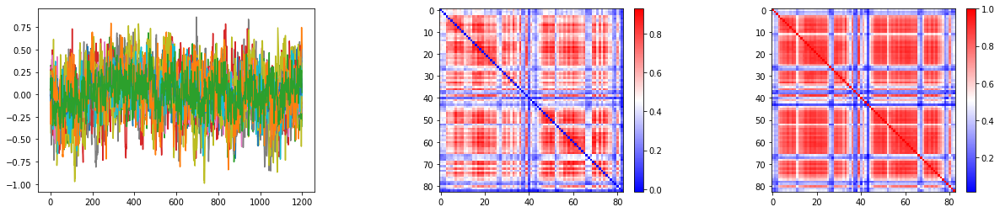

[0.6703866498120314, 1.2203268051147462, 0.100001, 0.6111006686687469, 1.7563815116882324, 20956.523797314796, 0.8902749532819864, 0.100001, 0.100001, 0.3524324754476547, 0.6673184633255005, 20957.380733080725]
22 157336


<Figure size 432x288 with 0 Axes>

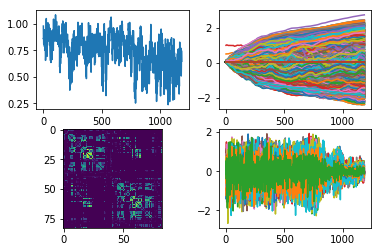

0.6847262987701267


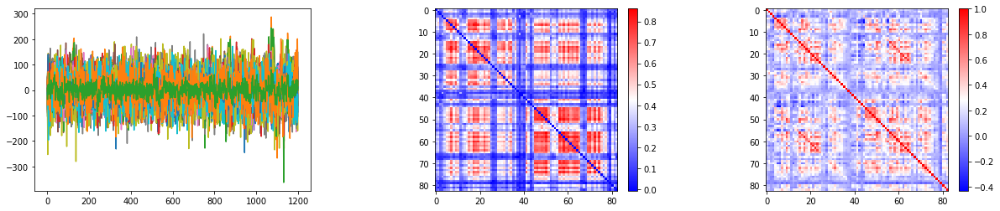

0.6980899437627677


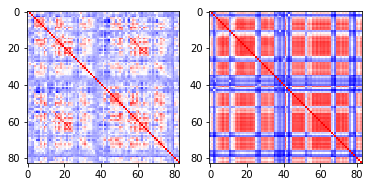

<Figure size 432x288 with 0 Axes>

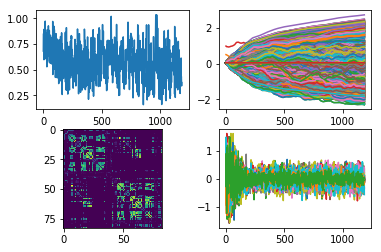

0.898693837992851


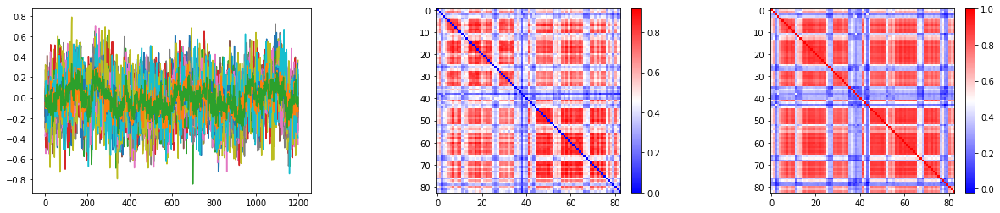

[0.6847262987701267, 0.9051097691059112, 0.100001, 1.542551637649536, 1.5337388634681703, 20961.876337069993, 0.898693837992851, 0.100001, 0.100001, 0.9770300517082214, 0.889272803068161, 20961.250855720835]
23 121921
24 145127
25 567961


<Figure size 432x288 with 0 Axes>

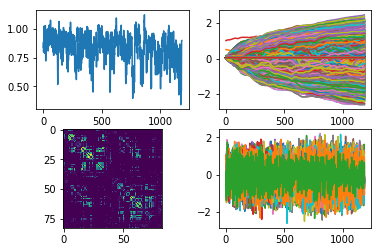

0.581176429486908


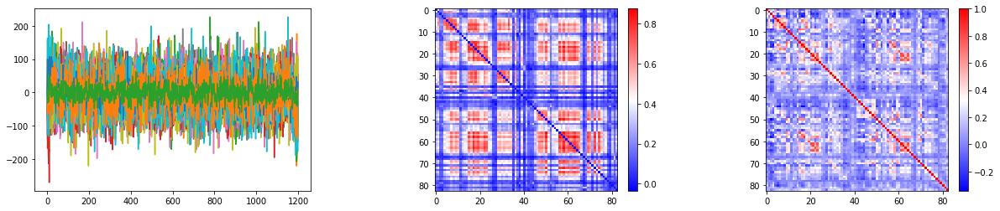

0.6033487076959722


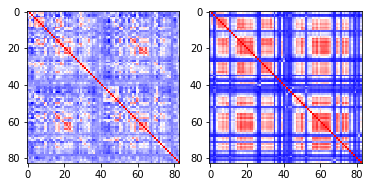

<Figure size 432x288 with 0 Axes>

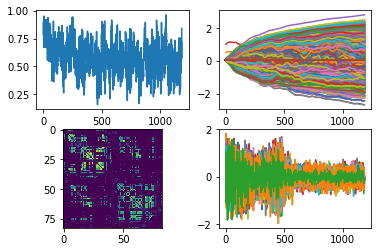

0.9183161349867525


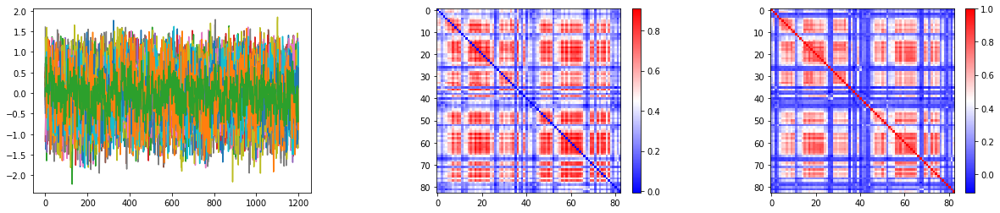

[0.581176429486908, 0.100001, 0.39675588011741636, 1.2755452642440794, 1.2576659321784973, 20935.7530705298, 0.9183161349867525, 0.100001, 0.100001, 0.3141184816360474, 1.0242256343364715, 20964.248513714807]
26 492754


<Figure size 432x288 with 0 Axes>

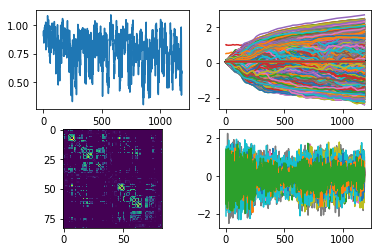

0.5463429155380006


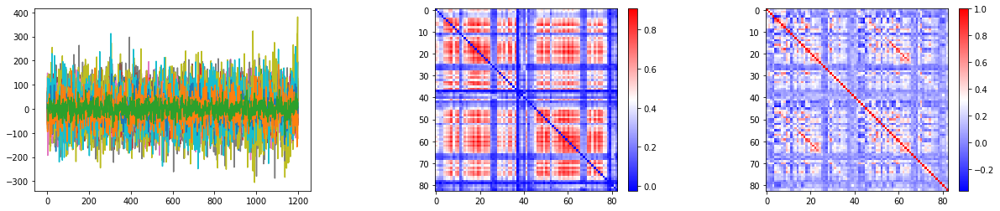

0.582497263009978


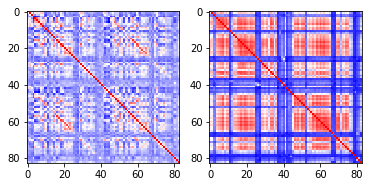

<Figure size 432x288 with 0 Axes>

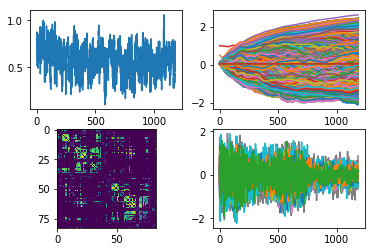

0.942073171172074


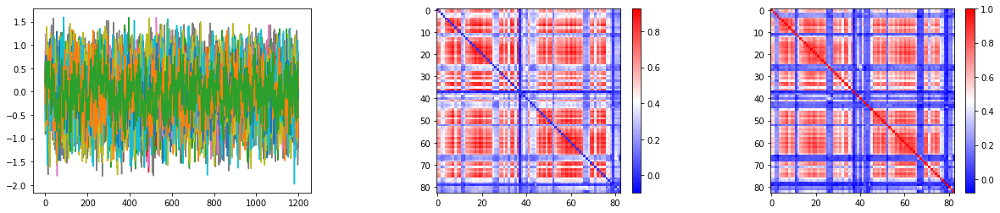

[0.5463429155380006, 0.946419632434845, 0.3100887253880501, 1.1242951641082763, 1.5947811126708986, 20958.129535805005, 0.942073171172074, 0.100001, 0.100001, 0.5566289315223694, 1.3009338021278383, 20953.385866147444]
27 562446


<Figure size 432x288 with 0 Axes>

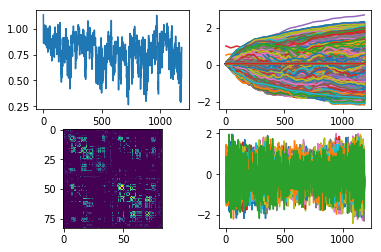

0.6189228972741827


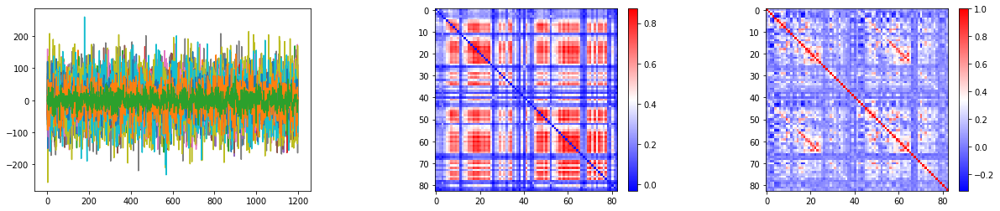

0.6329476772970589


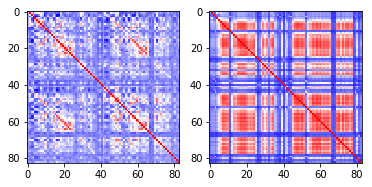

<Figure size 432x288 with 0 Axes>

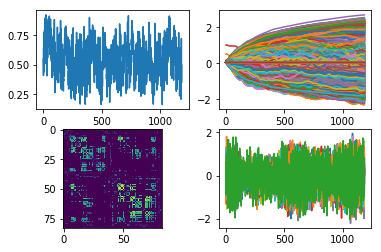

0.9735918225564235


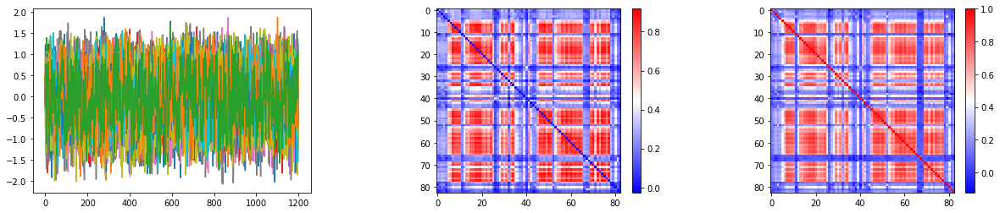

[0.6189228972741827, 0.5347704529762268, 0.42497478723526005, 1.205372227191925, 0.9760228753089905, 20957.544121457377, 0.9735918225564235, 0.48082331418991087, 0.40538055300712583, 0.7265411803722381, 0.9891824305057525, 20956.80915605298]
28 200210
29 151223
30 872158
31 579665


<Figure size 432x288 with 0 Axes>

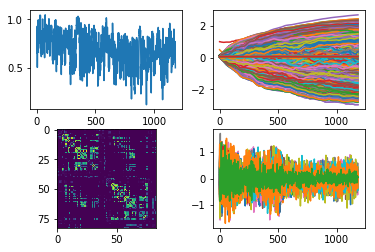

0.7618417670084313


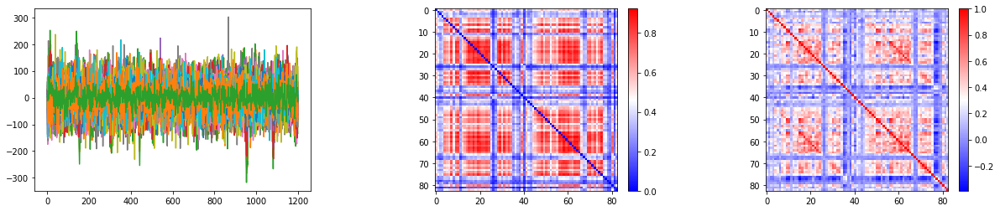

0.8126692561814943


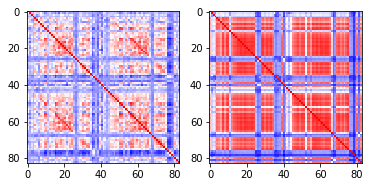

<Figure size 432x288 with 0 Axes>

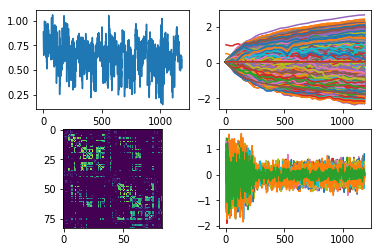

0.8393841618462323


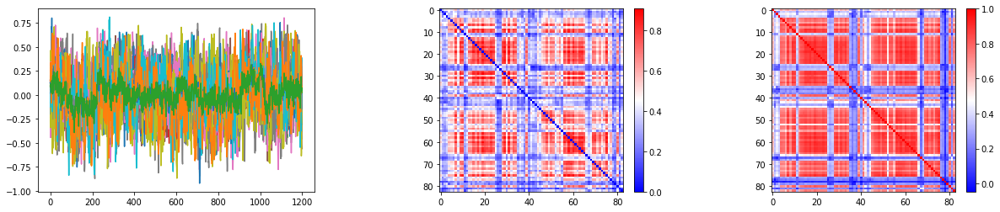

[0.7618417670084313, 0.100001, 0.100001, 0.9252576718330383, 0.9611981570720672, 20955.984099249927, 0.8393841618462323, 0.8305000245571136, 0.100001, 1.1577350387573242, 1.4753672242164613, 20957.116093441895]
32 548250


<Figure size 432x288 with 0 Axes>

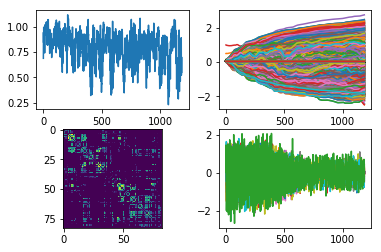

0.5843084036394461


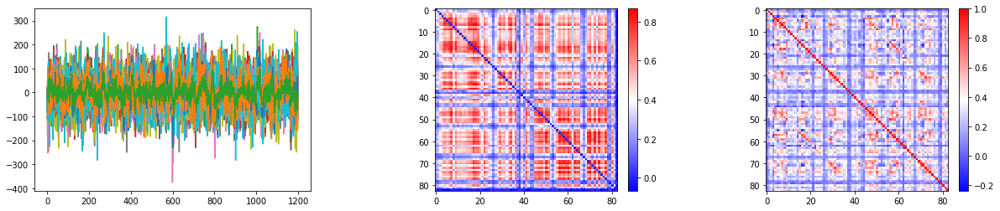

0.6697017585811647


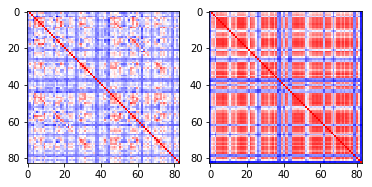

<Figure size 432x288 with 0 Axes>

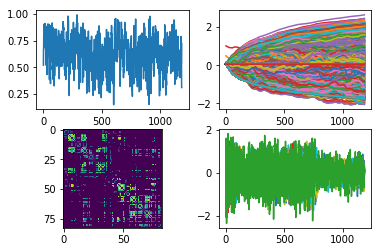

0.9457483230433207


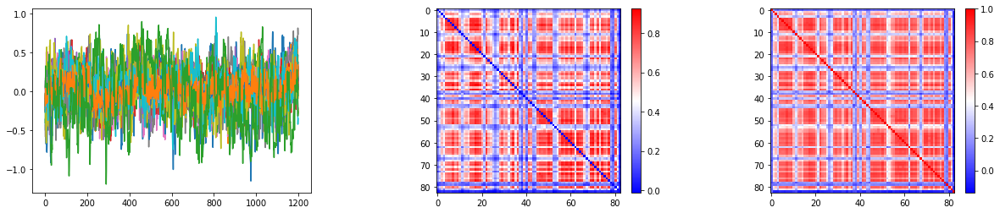

[0.5843084036394461, 0.100001, 0.100001, 0.535201842546463, 0.8612670838832855, 20962.889650956808, 0.9457483230433207, 0.100001, 0.100001, 0.05012312403321266, 0.9515790402889251, 20952.679372231894]
33 198350


<Figure size 432x288 with 0 Axes>

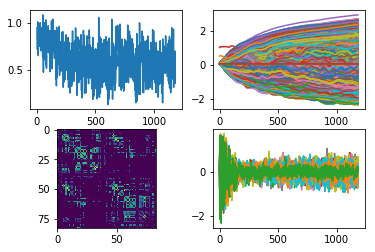

0.7905101310322653


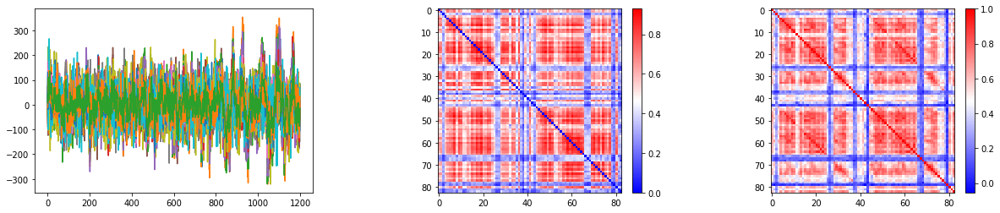

0.8797465641669747


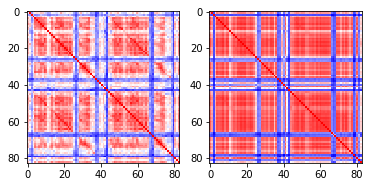

<Figure size 432x288 with 0 Axes>

KeyboardInterrupt: 

In [14]:
batch_size = 83
HCP_par_corr= {}
ROI_size = 83
#groups= ['CON_MCI']

subs=[sub for sub in os.listdir(SC_base_dir) if os.path.isdir(SC_base_dir+sub)]
subs = subs[:50]
for i in range(len(subs)):
    sub =subs[i]
    print(i, sub)
    SC_file = SC_base_dir+ sub +'/dsi_sd4/sub-' +sub +'_roisc33dwispace/weights.txt'
    TS_file = TS_base_dir+sub+ '_rfMRI_REST1_LR_hpc200_clean__l2k8_sc33_ts.pkl'
#groups= ['CON_MCI']



    
    if os.path.isfile(SC_file) and os.path.isfile(TS_file):
        HCP_par_corr[sub] = []
        SC= np.loadtxt(SC_file)
        TS_df=pd.read_pickle(TS_file)
        TS=TS_df.values
        TS_dmean =(TS.T -TS.T.mean(axis= 0)).T
        SC = (SC+SC.T)*0.5
        """SC1=SC[:48,:48].copy()
        SC2=SC[48:96,48:96].copy()
        SC3=SC[:48,48:96].copy()
        mask1 = (SC1-SC1.mean(axis=1)< 2.*SC1.std(axis=1)) 
        SC1[mask1]=0
        SC2[(SC2-SC2.mean(axis=1) <  2*SC2.std(axis=1)) ]=0
        SC3[(SC3-SC3.mean(axis=1)<  2*SC3.std(axis=1)) ]=0
        SC[:48,:48] = SC1
        SC[48:96,48:96] = SC2
        SC[:48,48:96] = 1*SC3
        SC[48:96,:48] = 1*SC3.T"""
        Wo = np.log1p(SC)/np.linalg.norm(np.log1p(SC))
        #L_s = (-np.diag(np.sum(W0, axis= 1)) + W0).astype(np.float32)
            
            
        num_data = TS.shape[0]

        total_series_length = num_data -echo_step #50000


        num_batches = total_series_length-truncated_backprop_length
            
        model_run(sub,Wo, TS)
    
        X0 = np.ones((6*batch_size,))/10.
        params = np.loadtxt(out_dir+'HCP_'+sub+'paramsList_test_p.txt')
        Theta = params[-10:,:].mean(axis = 0)

        tys=[]
        ROI_size= batch_size
        for j in range(4000):
            X = f_diffusion_tr_noise(X0,Wo, Theta)
        
            X0 = X
    
            tys.append(h_diffusion_noise(X0, Theta))
        
        tys=np.array(tys)
        #tys_dmean =(tys.T -tys.T.mean(axis= 0)).T
        FC_sim = np.corrcoef(tys[20:,:].T)
        FC=np.corrcoef(TS.T)
        np.savetxt(out_dir+'HCP_'+sub+'sim_bold_test_p.txt', np.array(tys))
        print(np.corrcoef(FC[np.tril_indices(batch_size,-1)], FC_sim[np.tril_indices(batch_size,-1)])[0,1])
        #HCP_par_corr[sub].append(np.corrcoef(FC[np.tril_indices(batch_size,-1)], FC_sim[np.tril_indices(batch_size,-1)])[0,1])
            
    
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[0:1])[0])
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[1:2])[0])
        HCP_par_corr[sub].append(.001+ smooth_normalize(Theta[2:3])[0])
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[3:4])[0])
        HCP_par_corr[sub].append(5000./0.459/0.641+4000.*np.tanh(Theta[4:5])[0])
        
        
            
        fig, ax = plt.subplots(1,2)
        ax[0].imshow(FC, cmap='bwr')
        ax[1].imshow(FC_sim, cmap='bwr')
        plt.show()
        
        TS_file = out_dir+'HCP_'+sub+ 'sim_bold_test_p.txt'
        TS=np.loadtxt(TS_file)
        TS_dmean =(TS.T -TS.T.mean(axis= 0)).T
        TS=TS[-1200:,:]
        
        model_run(sub,Wo, TS)
        params = np.loadtxt(out_dir+'HCP_'+sub+'paramsList_test_p.txt')
        Theta = params[-10:,:].mean(axis = 0)
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[0:1])[0])
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[1:2])[0])
        HCP_par_corr[sub].append(.001+ smooth_normalize(Theta[2:3])[0])
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[3:4])[0])
        HCP_par_corr[sub].append(5000./0.459/0.641+4000.*np.tanh(Theta[4:5])[0])
        print(HCP_par_corr[sub])

In [ ]:
HCP_par_corr_new={}
for sub in HCP_par_corr:
    HCP_par_corr_new['sub'+sub] = HCP_par_corr[sub]

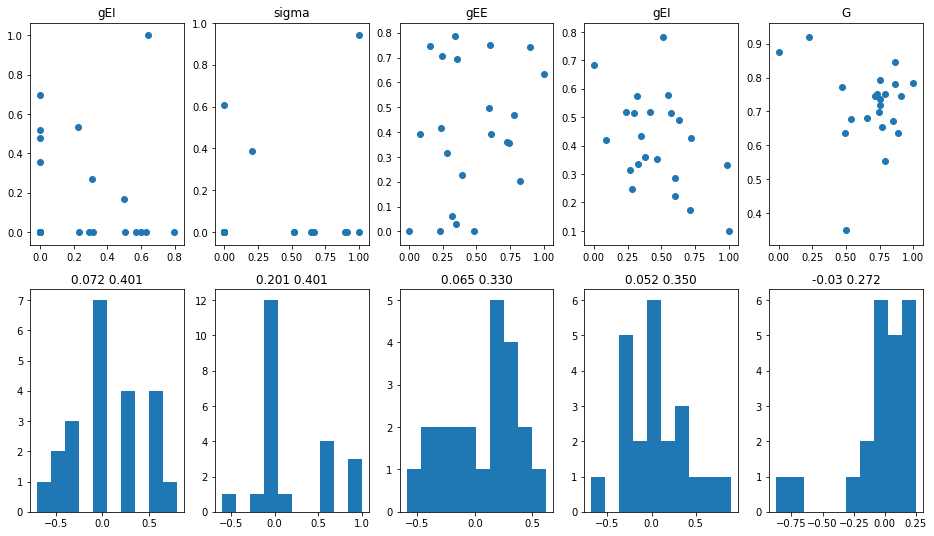

In [15]:
fig, ax=plt.subplots(2,5, figsize=(16,9))
titles=['gEI','sigma', 'gEE', 'gEI','G']
for i in range(5):
    x_lis=[]
    y_lis=[]
    for sub in HCP_par_corr:
        if len(HCP_par_corr[sub])>0 and len(HCP_par_corr[sub])==12:
            x_lis.append(HCP_par_corr[sub][i+1])
            y_lis.append(HCP_par_corr[sub][i+6+1])
        #print(np.corrcoef(np.array(x_lis), np.array(y_lis)))
    
    min_ls = min(min(x_lis), min(y_lis))
    max_ls = max(max(x_lis), max(y_lis))
    x_n=(x_lis-min_ls)/(max_ls-min_ls)
    y_n=(y_lis-min_ls)/(max_ls-min_ls)
   
    ax[0,i].scatter(np.array(x_n), np.array(y_n))
    ax[0,i].set_title(titles[i])
    ax[1,i].hist(np.array(x_n)- np.array(y_n))
    #slope, intercept, r_value, p_value, std_err = stats.linregress(np.array(x_lis)[mask], np.array(y_lis)[mask])
    diff_mean=(np.array(x_n)- np.array(y_n)).mean()
    diff_std=(np.array(x_n)- np.array(y_n)).std()
    ax[1,i].set_title(str(diff_mean)[:5] +' ' +str(diff_std)[:5])
plt.show()

In [ ]:
np.save(out_dir+'HCP_par_corr_p_50.npy', HCP_par_corr)

In [18]:
y_lis

[20965.282210331632,
 20965.707189581673,
 20968.45392346851,
 20964.590066799978,
 20969.135619916204,
 20958.22531532869,
 20967.521423748767,
 20962.52047912602,
 20966.425702043874,
 20970.232600653017,
 20968.286420427765,
 20965.122737913793,
 20971.372703155732,
 20969.192987783368,
 20966.93125974806,
 20968.937185964915,
 20968.18312998206,
 20966.102693359364,
 20966.737383670974,
 20968.966103752788,
 20968.976916815474,
 20970.072047381233,
 20969.63446884625,
 20964.02957454104,
 20963.456164070616,
 20965.981093382463,
 20970.89073077454,
 20971.065871032115,
 20968.608904573117,
 20967.36518460018,
 20968.23092010256,
 20968.018625643675,
 20967.514437499423,
 20968.228269519186]